In [78]:
import os, glob, re, pickle
from functools import partial
from collections import OrderedDict
import operator as op
from cytoolz import compose

import pandas as pd
import seaborn as sns
import numpy as np
import scanpy as sc
import anndata as ad
import matplotlib as mpl
import matplotlib.pyplot as plt
import networkx as nx
import warnings
from pyvis.network import Network
from rich import print

from pyscenic.export import export2loom, add_scenic_metadata
from pyscenic.utils import load_motifs
from pyscenic.transform import df2regulons
from pyscenic.aucell import aucell
from pyscenic.binarization import binarize
from pyscenic.rss import regulon_specificity_scores
from pyscenic.plotting import plot_binarization, plot_rss

from IPython.display import HTML, display

***
***
    Set up environment and data 
***
***

In [79]:
sc.settings.njobs = 32
plt.rcParams['figure.dpi'] = 240

In [80]:
RESOURCES_FOLDERNAME = "/home/dchafamo/final/data/"
RESULTS_FOLDERNAME = "/home/dchafamo/final/results/scenic/tbcfmm/"
AUXILLIARIES_FOLDERNAME = "/home/dchafamo/final/tmp/"
FIGURES_FOLDERNAME = f"{RESULTS_FOLDERNAME}figures/"

In [81]:
sc.settings.figdir = FIGURES_FOLDERNAME

In [82]:
BASE_URL = "http://motifcollections.aertslab.org/v9/logos/"
COLUMN_NAME_LOGO = "MotifLogo"
COLUMN_NAME_MOTIF_ID = "MotifID"
COLUMN_NAME_TARGETS = "TargetGenes"

In [83]:
def savesvg(fname: str, fig, folder: str=FIGURES_FOLDERNAME) -> None:
    """
    Save figure as vector-based SVG image format.
    """
    fig.tight_layout()
    fig.savefig(os.path.join(folder, fname), format='svg')

In [84]:
def display_logos(df: pd.DataFrame, top_target_genes: int = 3, base_url: str = BASE_URL):
    """
    :param df:
    :param base_url:
    """
    # Make sure the original dataframe is not altered.
    df = df.copy()
    
    # Add column with URLs to sequence logo.
    def create_url(motif_id):
        return '<img src="{}{}.png" style="max-height:124px;"></img>'.format(base_url, motif_id)
    df[("Enrichment", COLUMN_NAME_LOGO)] = list(map(create_url, df.index.get_level_values(COLUMN_NAME_MOTIF_ID)))
    
    # Truncate TargetGenes.
    def truncate(col_val):
        return sorted(col_val, key=op.itemgetter(1))[:top_target_genes]
    df[("Enrichment", COLUMN_NAME_TARGETS)] = list(map(truncate, df[("Enrichment", COLUMN_NAME_TARGETS)]))
    
    MAX_COL_WIDTH = pd.get_option('display.max_colwidth')
    pd.set_option('display.max_colwidth', -1)
    display(HTML(df.head().to_html(escape=False)))
    pd.set_option('display.max_colwidth', MAX_COL_WIDTH)

In [85]:

# Downloaded fromm pySCENIC github repo: https://github.com/aertslab/pySCENIC/tree/master/resources
HUMAN_TFS_FNAME = os.path.join(AUXILLIARIES_FOLDERNAME, 'lambert2018.txt')

# Ranking databases. Downloaded from cisTargetDB: https://resources.aertslab.org/cistarget/
RANKING_DBS_FNAMES = [
    'hg19-500bp-upstream-10species.mc9nr.genes_vs_motifs.rankings.feather',
    'hg19-tss-centered-5kb-10species.mc9nr.genes_vs_motifs.rankings.feather',
    'hg19-tss-centered-10kb-10species.mc9nr.genes_vs_motifs.rankings.feather'
]
RANKING_DBS_FNAMES = [os.path.join(AUXILLIARIES_FOLDERNAME, fn) for fn in RANKING_DBS_FNAMES]
DBS_PARAM = ' '.join(RANKING_DBS_FNAMES)

# Motif annotations. Downloaded from cisTargetDB: https://resources.aertslab.org/cistarget/
MOTIF_ANNOTATIONS_FNAME = os.path.join(AUXILLIARIES_FOLDERNAME, 'motifs-v9-nr.hgnc-m0.001-o0.0.tbl')


***
***
    Infer regulatory networks 
***
***

In [86]:
DATASET_ID = 'chl_singlecell'
TCGA_CODE = 'pseudo_1'

In [87]:
METADATA_FNAME = os.path.join(RESULTS_FOLDERNAME, '{}.metadata.csv'.format(DATASET_ID))
EXP_MTX_FNAME = os.path.join(RESULTS_FOLDERNAME, '{}.tpm.csv'.format(DATASET_ID))
EXP_MTX_QC_FNAME = os.path.join(RESULTS_FOLDERNAME, '{}.qc.tpm.csv'.format(DATASET_ID))
ADJACENCIES_FNAME = os.path.join(RESULTS_FOLDERNAME, '{}.adjacencies.tsv'.format(DATASET_ID))
MOTIFS_FNAME = os.path.join(RESULTS_FOLDERNAME, '{}.motifs.csv'.format(DATASET_ID))
REGULONS_DAT_FNAME = os.path.join(RESULTS_FOLDERNAME, '{}.regulons.dat'.format(DATASET_ID))
AUCELL_MTX_FNAME = os.path.join(RESULTS_FOLDERNAME, '{}.auc.csv'.format(DATASET_ID))
ANNDATA_FNAME = os.path.join(RESULTS_FOLDERNAME, '{}.h5ad'.format(DATASET_ID))
LOOM_FNAME = os.path.join(RESULTS_FOLDERNAME, '{}_{}.loom'.format(TCGA_CODE, DATASET_ID))
BIN_MTX_FNAME = os.path.join(RESULTS_FOLDERNAME, '{}.bin.csv'.format(DATASET_ID))
THR_FNAME = os.path.join(RESULTS_FOLDERNAME, '{}.thresholds.csv'.format(DATASET_ID))

In [88]:
celltypes = [
    'B_cells', 'Tumor', 'CD4_T_cells', 'Fibroblasts', 'Macrophages', 'Monocytes' 
]

if not os.path.exists(os.path.join(RESULTS_FOLDERNAME, 'tbcfmm_scenic.h5ad')):
    
    adata = sc.read_h5ad(os.path.join(RESOURCES_FOLDERNAME, 'combined_dataset_final_v2.h5ad'))
    adata.obs['cell_type'] = adata.obs.cell_types_level_3
    subsampled = adata.obs[adata.obs.cell_types_level_3.isin(celltypes)]\
        .groupby(['cell_types_level_4', 'condition'])\
        .apply(lambda x: x.sample(min(7000, len(x))) if all(x.cell_types_level_4 == 'Tumor') else x.sample(min(5000, len(x))) )\
        .index.get_level_values(2)
    adata = adata[subsampled, :].copy()
    sc.pp.filter_genes(adata, min_cells=50)
    print(adata.shape)
    adata.write_h5ad(os.path.join(RESULTS_FOLDERNAME, 'tbcfmm_scenic.h5ad'))
    adata.to_df().to_csv(EXP_MTX_QC_FNAME)
else:
    adata = sc.read_h5ad(os.path.join(RESULTS_FOLDERNAME, 'tbcfmm_scenic.h5ad'))
print(adata)

AnnData object with n_obs × n_vars = 97063 × 25458
    obs: 'nCount_uncorrected', 'nFeature_uncorrected', 'orig.ident', 'nCount_originalexp', 'nFeature_originalexp', 
'nCount_cellbender_corrected', 'nFeature_cellbender_corrected', 'gem_lane', 'donor', 'year_of_dx', 'institution', 
'condition', 'tissue_site', 'histo_subtype', 'age', 'sex', 'experimental_batch', 'seq_tech', 'sequencing_batch', 
'replicates', 'percent.mt', 'percent.ribo', 'ident', 'scDblFinder.sample', 'scDblFinder.cluster', 
'scDblFinder.class', 'scDblFinder.score', 'scDblFinder.ratio', 'scDblFinder.weighted', 'scDblFinder.nearestClass', 
'scDblFinder.difficulty', 'scDblFinder.cxds_score', 'scDblFinder.mostLikelyOrigin', 'scDblFinder.originAmbiguous', 
'cellbender_corrected_snn_res.0.5', 'seurat_clusters', 'cellbender_corrected_snn_res.0.3', 'SingleR.labels.hpca', 
'SingleR.labels.encode', 'SingleR.labels.dice.main', 'SingleR.labels.dice.fine', 'SingleR.labels.monaco.main', 
'SingleR.labels.monaco.fine', 'SingleR.labels.steidl.basic', 'SingleR.labels.steidl.int', 
'SingleR.labels.steidl.fine', 'cell_types_level_1', 'cell_types_level_2', 'cell_types_level_3', 
'Immune_All_Low.predicted_labels', 'Immune_All_Low.majority_voting', 'Immune_All_Low.conf_score', 
'Immune_All_High.predicted_labels', 'Immune_All_High.majority_voting', 'Immune_All_High.conf_score', 
'cell_types_level_4', 'cell_types_level_5', 'ebv_status', 'cell_type'
    var: 'vst.mean', 'vst.variance', 'vst.variance.expected', 'vst.variance.standardized', 'vst.variable', 
'n_cells'
    obsm: 'X_harmony', 'X_pca', 'X_umap'
    varm: 'HARMONY', 'PCs'

In [89]:
adata.obs.cell_types_level_3.value_counts()

CD4_T_cells    39154
B_cells        29977
Macrophages     8961
Fibroblasts     8487
Tumor           6720
Monocytes       3764
Name: cell_types_level_3, dtype: int64

In [90]:
f'nohup pyscenic grn {EXP_MTX_QC_FNAME} {HUMAN_TFS_FNAME} -o {ADJACENCIES_FNAME} --num_workers 32 > grn.log &'

'nohup pyscenic grn /home/dchafamo/final/results/scenic/tbcfmm/chl_singlecell.qc.tpm.csv /home/dchafamo/final/tmp/lambert2018.txt -o /home/dchafamo/final/results/scenic/tbcfmm/chl_singlecell.adjacencies.tsv --num_workers 32 > grn.log &'

In [91]:
pd.read_csv(ADJACENCIES_FNAME, sep='\t').head()

,TF,target,importance
0,TSHZ2,AL109930.1,1172.696049
1,HIF1A,HIF1A-AS2,801.607984
2,TSHZ2,AL391097.1,730.922863
3,BACH1,GRIK1,712.963266
4,AHR,AC073332.1,636.440124


***
***
    Predict Regulons
***
***

In [92]:
f"""nohup pyscenic ctx {ADJACENCIES_FNAME} {DBS_PARAM} \
            --annotations_fname {MOTIF_ANNOTATIONS_FNAME} \
            --expression_mtx_fname {EXP_MTX_QC_FNAME} \
            --output {MOTIFS_FNAME} \
            --num_workers 8 > ctx.log &"""

'nohup pyscenic ctx /home/dchafamo/final/results/scenic/tbcfmm/chl_singlecell.adjacencies.tsv /home/dchafamo/final/tmp/hg19-500bp-upstream-10species.mc9nr.genes_vs_motifs.rankings.feather /home/dchafamo/final/tmp/hg19-tss-centered-5kb-10species.mc9nr.genes_vs_motifs.rankings.feather /home/dchafamo/final/tmp/hg19-tss-centered-10kb-10species.mc9nr.genes_vs_motifs.rankings.feather             --annotations_fname /home/dchafamo/final/tmp/motifs-v9-nr.hgnc-m0.001-o0.0.tbl             --expression_mtx_fname /home/dchafamo/final/results/scenic/tbcfmm/chl_singlecell.qc.tpm.csv             --output /home/dchafamo/final/results/scenic/tbcfmm/chl_singlecell.motifs.csv             --num_workers 8 > ctx.log &'

In [93]:
df_motifs = load_motifs(MOTIFS_FNAME)
df_motifs.reset_index()[:2].T

0  \
TF                                                                             ARNT   
MotifID                                                                cisbp__M4579   
Enrichment AUC                                                             0.067112   
           NES                                                             3.055801   
           MotifSimilarityQvalue                                           0.000998   
           OrthologousIdentity                                                  1.0   
           Annotation             motif similar to swissregulon__hs__ARNT_ARNT2_...   
           Context                (hg19-500bp-upstream-10species.mc9nr.genes_vs_...   
           TargetGenes            [(NUB1, 0.6940902395975572), (LGR4, 0.64158178...   
           RankAtMax                                                            821   

                                                                                  1  
TF                                                                             ARNT  
MotifID                                                                cisbp__M5111  
Enrichment AUC                                                             0.069296  
           NES                                                             3.209763  
           MotifSimilarityQvalue                                           0.000995  
           OrthologousIdentity                                                  1.0  
           Annotation             gene is annotated for similar motif transfac_p...  
           Context                (hg19-500bp-upstream-10species.mc9nr.genes_vs_...  
           TargetGenes            [(IGF2R, 0.5156484838611488), (SOCS5, 0.611754...  
           RankAtMax                                                            857

In [94]:
def derive_regulons(motifs, db_names=('hg19-tss-centered-10kb-10species.mc9nr.genes_vs_motifs.rankings', 
                                 'hg19-500bp-upstream-10species.mc9nr.genes_vs_motifs.rankings', 
                                 'hg19-tss-centered-5kb-10species.mc9nr.genes_vs_motifs.rankings')):
    motifs.columns = motifs.columns.droplevel(0)

    def contains(*elems):
        def f(context):
            return any(elem in context for elem in elems)
        return f

    # For the creation of regulons we only keep the 10-species databases and the activating modules. We also remove the
    # enriched motifs for the modules that were created using the method 'weight>50.0%' (because these modules are not part
    # of the default settings of modules_from_adjacencies anymore.
    motifs = motifs[
        np.fromiter(map(compose(op.not_, contains('weight>50.0%')), motifs.Context), dtype=bool) & \
        np.fromiter(map(contains(*db_names), motifs.Context), dtype=bool) & \
        np.fromiter(map(contains('activating'), motifs.Context), dtype=bool)]
    ends_with_phrase = 'which is directly annotated for motif'
    # We build regulons only using enriched motifs with a NES of 3.0 or higher; we take only directly annotated TFs or TF annotated
    # for an orthologous gene into account; and we only keep regulons with at least 10 genes.
    regulons = list(filter(lambda r: len(r) >= 10, df2regulons(motifs[(motifs['NES'] >= 3.0) 
                                                                      & ((motifs['Annotation'] == 'gene is directly annotated')
                                                                        | (motifs['Annotation'].str.startswith('gene is orthologous to') 
                                                                           & motifs['Annotation'].str.endswith(ends_with_phrase)))
                                                                     ])))
    
    # Rename regulons, i.e. remove suffix.
    return list(map(lambda r: r.rename(r.transcription_factor), regulons))

In [18]:
regulons = derive_regulons(df_motifs)
with open(REGULONS_DAT_FNAME, 'wb') as f:
    pickle.dump(regulons, f)

Create regulons from a dataframe of enriched features.
Additional columns saved: []


In [95]:
with open(REGULONS_DAT_FNAME, 'rb') as f:
    regulons = pickle.load(f)
print(f'{len(regulons)} regulons found with NES (normalized enrichment score) > 3.0')

129 regulons found with NES (normalized enrichment score) > 3.0

In [21]:
%%time
adata_tpm = adata.copy()
adata_tpm.X = adata_tpm.X.expm1() * 100 # TPM
df_mtx = adata_tpm.to_df()
auc_mtx = aucell(df_mtx, regulons, num_workers=32, auc_threshold=0.05)
auc_mtx.to_csv(AUCELL_MTX_FNAME)

CPU times: user 1min 51s, sys: 21.3 s, total: 2min 12s
Wall time: 2min 21s


In [96]:
auc_mtx = pd.read_csv(AUCELL_MTX_FNAME, index_col=0)
print(auc_mtx.shape)

(97063, 129)

***
***
    Binarize Regulon activity 
***
***

In [20]:
%%time
bin_mtx, thresholds = binarize(auc_mtx) 
bin_mtx.to_csv(BIN_MTX_FNAME) 
thresholds.to_frame().rename(columns={0:'threshold'}).to_csv(THR_FNAME)

CPU times: user 1.1 s, sys: 228 ms, total: 1.33 s
Wall time: 2h 6min 10s


In [97]:
bin_mtx = pd.read_csv(BIN_MTX_FNAME, index_col=0)
thresholds = pd.read_csv(THR_FNAME, index_col=0).threshold

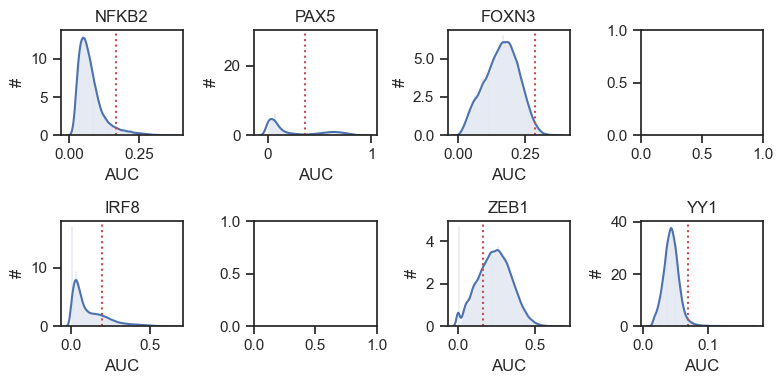

In [28]:
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    
    sns.set(font_scale=1)
    sns.set_style("ticks")

    fig, ((ax1, ax2, ax3, ax4), (ax5, ax6, ax7, ax8)) = plt.subplots(2, 4, figsize=(8, 4), dpi=100)

    plot_binarization(auc_mtx, 'NFKB2', thresholds['NFKB2'], ax=ax1)
    plot_binarization(auc_mtx, 'PAX5', thresholds['PAX5'], ax=ax2)
    plot_binarization(auc_mtx, 'FOXN3', thresholds['FOXN3'], ax=ax3)
    # plot_binarization(auc_mtx, 'BATF3', thresholds['BATF3'], ax=ax4)
    plot_binarization(auc_mtx, 'IRF8', thresholds['IRF8'], ax=ax5)
    # plot_binarization(auc_mtx, 'IRF4', thresholds['IRF4'], ax=ax6)
    plot_binarization(auc_mtx, 'ZEB1',  thresholds['ZEB1'], ax=ax7)
    plot_binarization(auc_mtx, 'YY1', thresholds['YY1'], ax=ax8)

    plt.tight_layout()

In [54]:
def palplot(pal, names, colors=None, size=1):
    n = len(pal)
    f, ax = plt.subplots(1, 1, figsize=(n * size, size))
    ax.imshow(np.arange(n).reshape(1, n),
              cmap=mpl.colors.ListedColormap(list(pal)),
              interpolation="nearest", aspect="auto")
    ax.set_xticks(np.arange(n) - .5)
    ax.set_yticks([-.5, .5])
    ax.set_xticklabels([])
    ax.set_yticklabels([])
    colors = n * ['white'] if colors is None else colors
    for idx, (name, color) in enumerate(zip(names, colors)):
        ax.text(0.0+idx, 0.0, name, color=color, horizontalalignment='center', verticalalignment='center')
    return f

In [30]:
adata.obs['cell_type_condition'] = adata.obs.cell_type.astype(str) + '_' + adata.obs.condition.astype(str)

In [31]:
catagories = 'cell_types_level_3'
N_COLORS = len(adata.obs[catagories].unique())
COLORS = [color for color in sns.color_palette("Dark2")][:N_COLORS]
df_metadata = adata.obs 
cell_type_color_lut = dict(zip(adata.obs[catagories].unique(), COLORS))
cell_id2cell_type_lut = df_metadata[catagories].to_dict()
bw_palette = sns.xkcd_palette(["white", "black"])

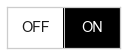

In [33]:
sns.set()
sns.set(font_scale=1.2)
sns.set_style("whitegrid")
fig = palplot(bw_palette, ['OFF', 'ON'], ['k', 'w'])
savesvg('legend - chl - on_off.svg', fig)

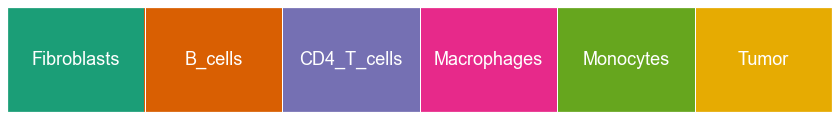

In [34]:
sns.set()
sns.set(font_scale=1.5)
fig = palplot(sns.color_palette(COLORS), adata.obs[catagories].unique(), size=2.0)
savesvg('legend - chl - cell_type_colors.svg', fig)

In [35]:
norm_auc = (auc_mtx.T/auc_mtx.T.max()).T

/home/dchafamo/anaconda3/envs/pyscenic/lib/python3.10/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


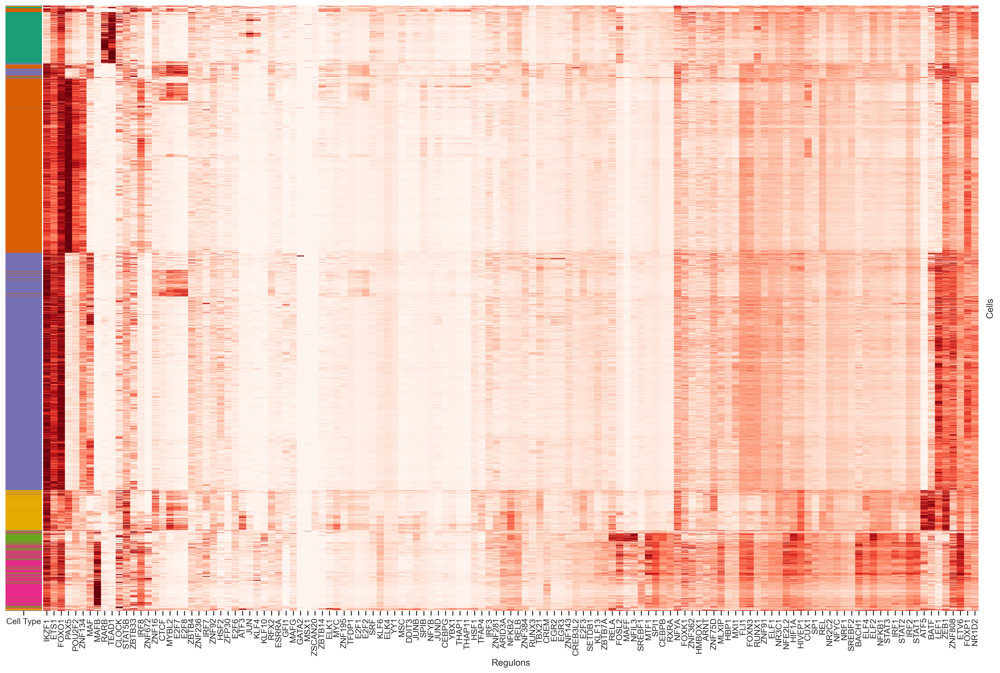

In [36]:
sns.set()
plt.rcParams['figure.dpi'] = 300
sns.set(font_scale=1.0)
sns.set_style("ticks", {"xtick.minor.size": 1, "ytick.minor.size": 0.1})

g = sns.clustermap(
    norm_auc, 
    row_colors=auc_mtx.index.map(cell_id2cell_type_lut).map(cell_type_color_lut),
    cmap='Reds', 
    figsize=(25,15), 
    xticklabels=True
)

g.ax_heatmap.set_yticklabels([])
g.ax_heatmap.set_yticks([])
g.ax_heatmap.set_ylabel('Cells')
g.ax_heatmap.set_xlabel('Regulons')
g.ax_row_colors.set_xticks([0.5])
g.ax_row_colors.set_xticklabels(['Cell Type'])
g.cax.set_visible(False)
g.ax_row_dendrogram.set_visible(False)
g.ax_col_dendrogram.set_visible(False)
g.fig.savefig(os.path.join(FIGURES_FOLDERNAME, 'clustermap2 - chl.png'), format='png')

/home/dchafamo/anaconda3/envs/pyscenic/lib/python3.10/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


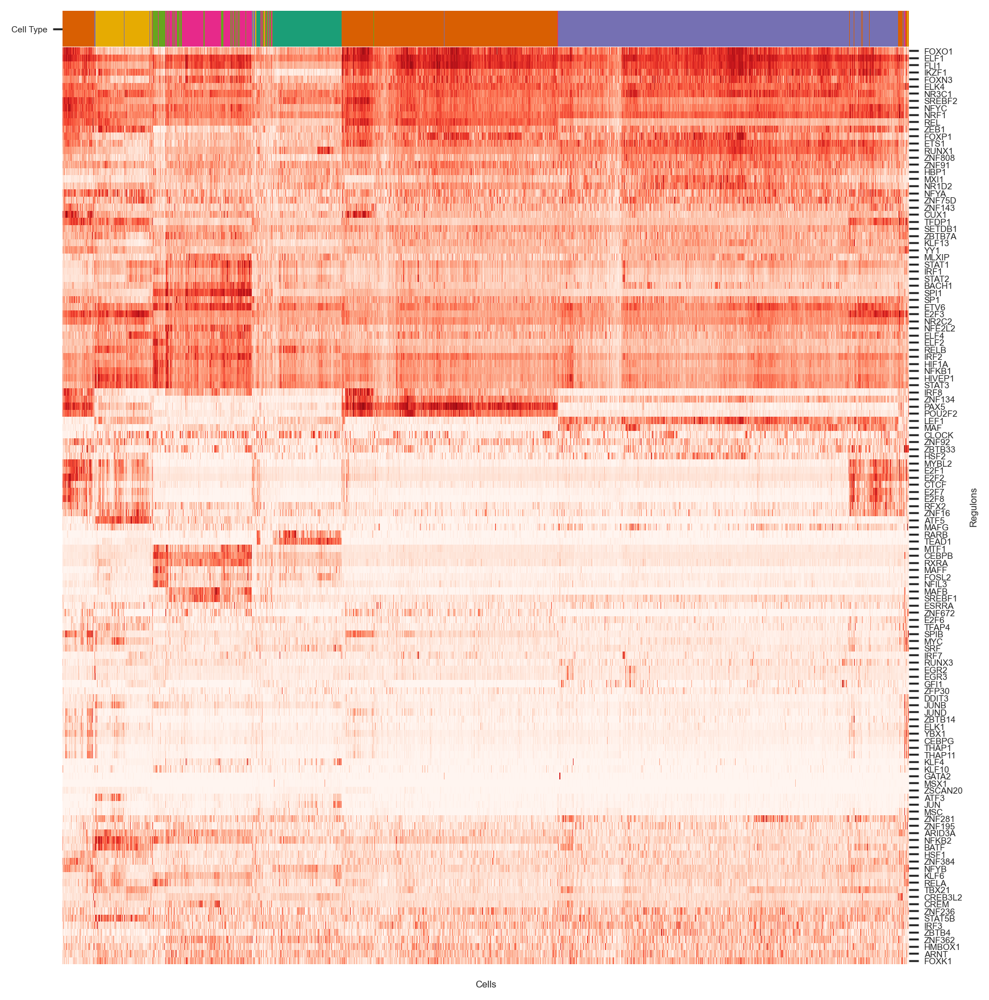

In [37]:
norm_auc = auc_mtx/auc_mtx.max()

sns.set()
plt.rcParams['figure.dpi'] = 200
sns.set(font_scale=0.5)
sns.set_style("ticks", {"xtick.minor.size": 1, "ytick.minor.size": 0.1})

g = sns.clustermap(
    norm_auc.T, 
    col_colors=auc_mtx.index.map(cell_id2cell_type_lut).map(cell_type_color_lut),
    cmap='Reds',
    figsize=(10,12), 
    yticklabels=True
)
g.ax_heatmap.set_xticklabels([])
g.ax_heatmap.set_xticks([])
g.ax_heatmap.set_xlabel('Cells')
g.ax_heatmap.set_ylabel('Regulons')
g.ax_col_colors.set_yticks([0.5])
g.ax_col_colors.set_yticklabels(['Cell Type'])
g.cax.set_visible(False)
g.ax_row_dendrogram.set_visible(False)
g.ax_col_dendrogram.set_visible(False)
g.fig.savefig(os.path.join(FIGURES_FOLDERNAME, 'aucell_clustermap.png'), format='png')

In [38]:
auc_mtx_copy = auc_mtx.copy()
auc_mtx_copy[catagories] = adata.obs[catagories]
auc_mtx_copy = auc_mtx_copy.groupby(catagories).mean()

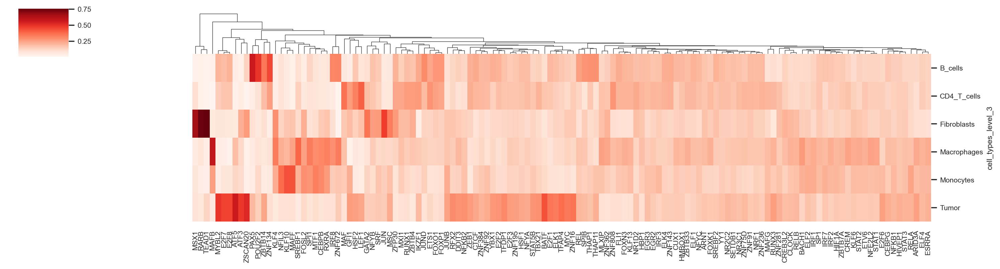

In [39]:
plt.rcParams['figure.dpi'] = 200
sns.set(font_scale=0.7)
g = sns.clustermap(
    (auc_mtx_copy/auc_mtx_copy.sum()), 
    cmap='Reds',
    row_cluster=False,
    figsize=(15,4), 
    xticklabels=True
)

/home/dchafamo/anaconda3/envs/pyscenic/lib/python3.10/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


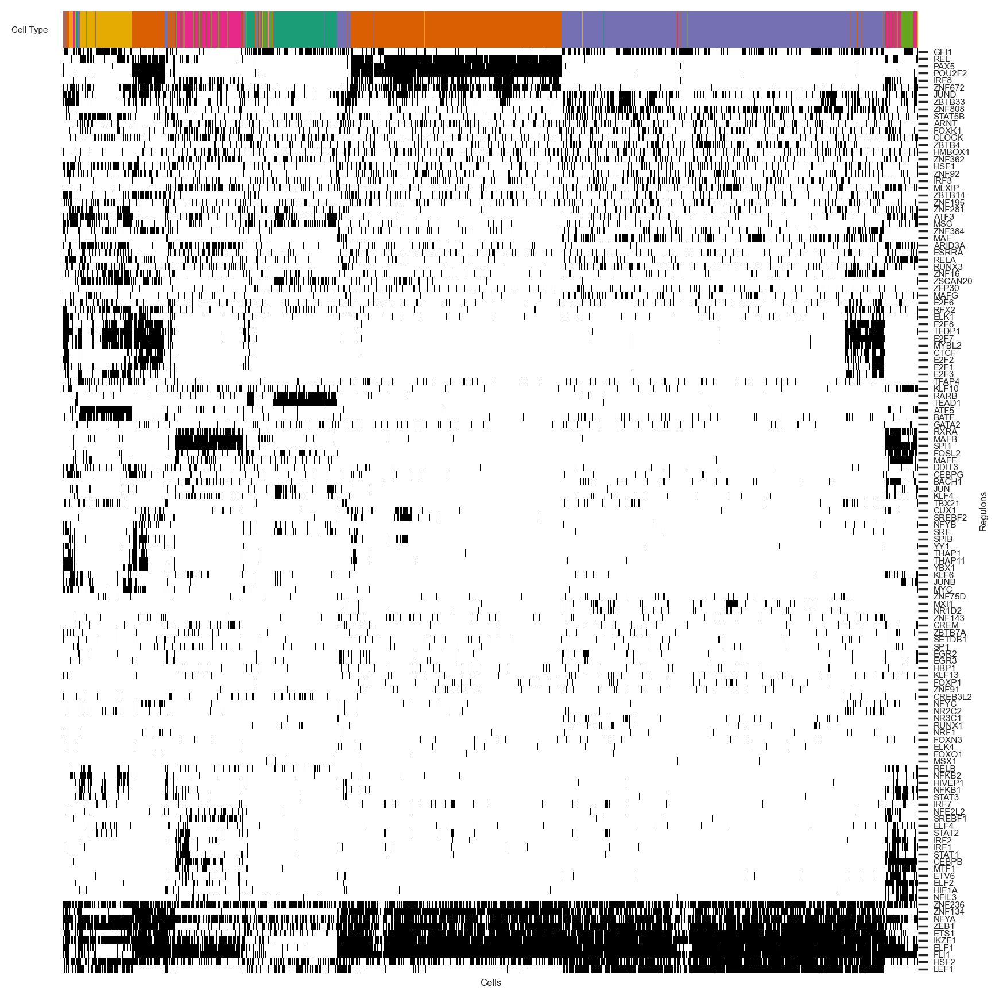

In [40]:
sns.set(font_scale=0.5)
g = sns.clustermap(
    bin_mtx.T, 
    col_colors=auc_mtx.index.map(cell_id2cell_type_lut).map(cell_type_color_lut),
    cmap=bw_palette, 
    figsize=(10,12), 
    yticklabels=True
)
g.ax_heatmap.set_xticklabels([])
g.ax_heatmap.set_xticks([])
g.ax_heatmap.set_xlabel('Cells')
g.ax_heatmap.set_ylabel('Regulons')
g.ax_col_colors.set_yticks([0.5])
g.ax_col_colors.set_yticklabels(['Cell Type'])
g.cax.set_visible(False)
g.ax_row_dendrogram.set_visible(False)
g.ax_col_dendrogram.set_visible(False)
g.fig.savefig(os.path.join(FIGURES_FOLDERNAME, 'aucell_clustermap_binarized.png'), format='png')

In [41]:
# For each regulon, we normalize the regulon activity based on the maximum regulon activity across all cells. 
norm_auc = auc_mtx/auc_mtx.max()
norm_auc['cell_type'] = norm_auc.index.map(adata.obs['cell_type'].to_dict())
norm_auc['condition'] = norm_auc.index.map(adata.obs['condition'].to_dict())

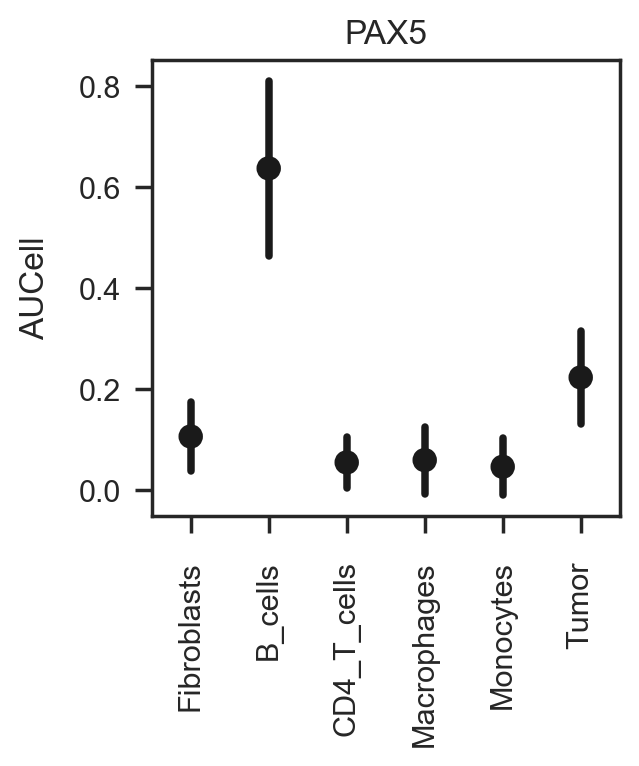

In [72]:
plt.rcParams['figure.dpi'] = 100
sns.set_theme(style="ticks", rc={"axes.facecolor": (0, 0, 0, 0)}, font_scale=1)

gene = 'PAX5'
color=(0.9058823529411765, 0.5411764705882353, 0.7647058823529411)
        
fig, ax = plt.subplots(figsize=(3, 3))
ax = sns.pointplot(data=norm_auc, x='cell_type', y=gene, color='k', ax=ax, join=False, errorbar='sd', dodge=True)
ax.set(title=gene)

plt.xlabel("",labelpad=10)

plt.ylabel("AUCell",labelpad=10)
plt.tick_params(axis='x', which='major', pad=10)
plt.tick_params(axis='y', which='major', pad=5)
plt.xticks(rotation=90)
plt.show()

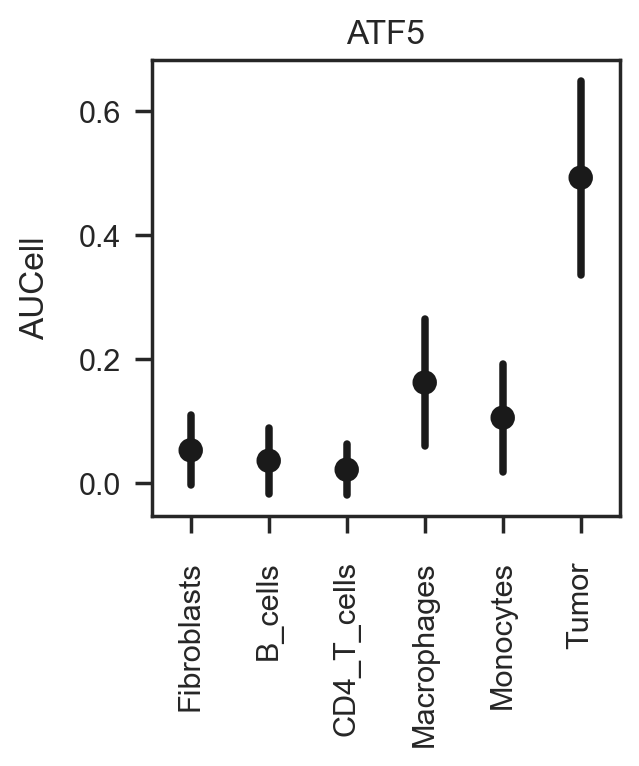

In [73]:
plt.rcParams['figure.dpi'] = 100
sns.set_theme(style="ticks", rc={"axes.facecolor": (0, 0, 0, 0)}, font_scale=1)

gene = 'ATF5'
color=(0.9058823529411765, 0.5411764705882353, 0.7647058823529411)
        
fig, ax = plt.subplots(figsize=(3, 3))
ax = sns.pointplot(data=norm_auc, x='cell_type', y=gene, color='k', ax=ax, join=False, errorbar='sd', dodge=True)
ax.set(title=gene)

plt.xlabel("",labelpad=10)

plt.ylabel("AUCell",labelpad=10)
plt.tick_params(axis='x', which='major', pad=10)
plt.tick_params(axis='y', which='major', pad=5)
plt.xticks(rotation=90)
plt.show()

In [46]:
bin_mtx_clustered = bin_mtx.T.copy()
bin_mtx_clustered.rename(columns=adata.obs['cell_type'].to_dict(), inplace=True)
bin_mtx_clustered.iloc[g.dendrogram_row.reordered_ind, g.dendrogram_col.reordered_ind].\
    to_csv(os.path.join(RESULTS_FOLDERNAME, 'binarized_regulon_activity.csv'))

In [47]:
def fetch_logo(regulon, base_url = BASE_URL):
    for elem in regulon.context:
        if elem.endswith('.png'):
            return '<img src="{}{}" style="max-height:124px;"></img>'.format(base_url, elem)
    return ""

In [48]:
df_regulons = pd.DataFrame(data=[list(map(op.attrgetter('name'), regulons)),
                                 list(map(len, regulons)),
                                 list(map(fetch_logo, regulons))], index=['name', 'count', 'logo']).T

In [49]:
MAX_COL_WIDTH = pd.get_option('display.max_colwidth')
pd.set_option('display.max_colwidth', -1)
display(HTML(df_regulons[df_regulons.name.isin(['BATF3', 'FOXN3', 'IRF8', 'ATF5', 'ZEB1'])].to_html(escape=False)))
pd.set_option('display.max_colwidth', MAX_COL_WIDTH)

/tmp/ipykernel_6104/1529824804.py:2: FutureWarning: Passing a negative integer is deprecated in version 1.0 and will not be supported in future version. Instead, use None to not limit the column width.
  pd.set_option('display.max_colwidth', -1)


,name,count,logo
3,ATF5,18,
33,FOXN3,68,
49,IRF8,33,
113,ZEB1,18,


***
***
    Dim reduction and clustering
***
***

In [50]:
sc.pp.highly_variable_genes(adata)
adata = adata[:, adata.var['highly_variable']]
sc.tl.pca(adata, svd_solver='arpack')
sc.tl.tsne(adata)

/home/dchafamo/anaconda3/envs/pyscenic/lib/python3.10/site-packages/scanpy/preprocessing/_pca.py:229: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  adata.obsm['X_pca'] = X_pca


/home/dchafamo/anaconda3/envs/pyscenic/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/dchafamo/anaconda3/envs/pyscenic/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


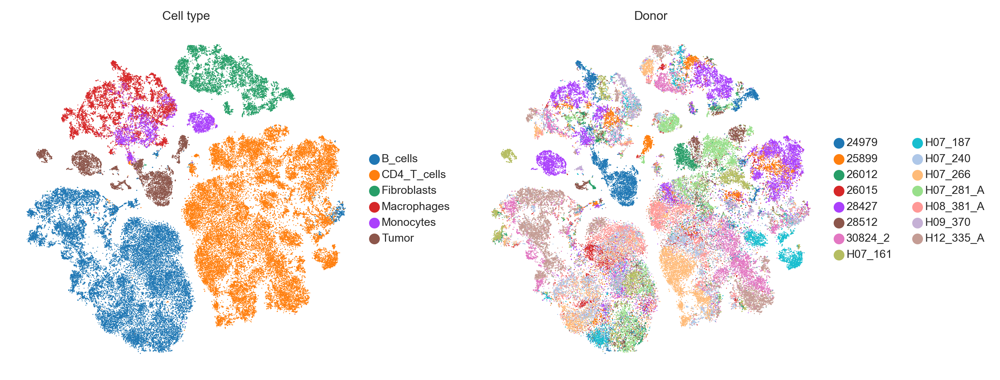

In [51]:
sc.set_figure_params(frameon=False, dpi=150, fontsize=8)
sc.pl.tsne(adata, color=['cell_type', 'donor'], title=['Cell type', 'Donor'], ncols=2, save='celltype_donor_PCA_tSNE.svg')

In [52]:
add_scenic_metadata(adata, auc_mtx, regulons)
adata.write_h5ad(ANNDATA_FNAME)

In [98]:
adata = ad.read_h5ad(ANNDATA_FNAME)

In [54]:
sc.tl.tsne(adata, use_rep='X_aucell')

/home/dchafamo/anaconda3/envs/pyscenic/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/dchafamo/anaconda3/envs/pyscenic/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


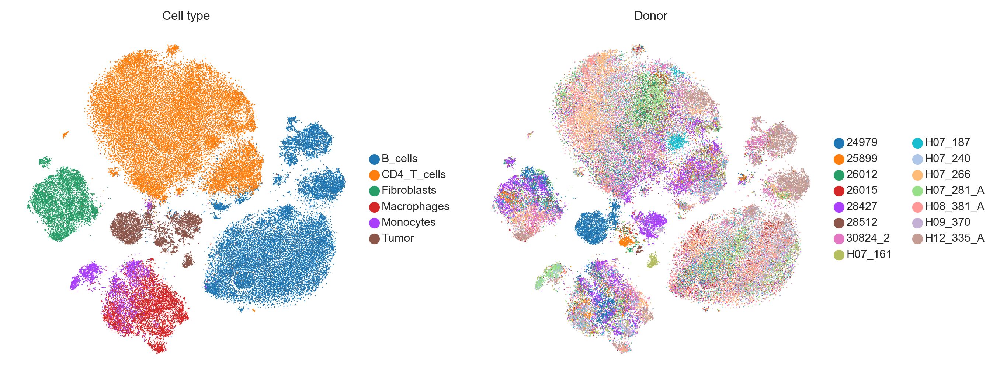

In [55]:
sc.set_figure_params(frameon=False, dpi=150, fontsize=8)
sc.pl.tsne(adata, color=['cell_type', 'donor'], title=['Cell type', 'Donor'], ncols=2, save='scenic_celltype_donor_PCA_tSNE.svg')

In [99]:
rss = regulon_specificity_scores(auc_mtx, adata.obs.cell_types_level_3)
rss.head()

,ARID3A,ARNT,ATF3,ATF5,BACH1,BATF,CEBPB,CEBPG,CLOCK,CREB3L2,...,ZNF236,ZNF281,ZNF362,ZNF384,ZNF672,ZNF75D,ZNF808,ZNF91,ZNF92,ZSCAN20
Fibroblasts,0.241026,0.262222,0.323700,0.228557,0.263773,0.219253,0.293160,0.254574,0.278762,0.290208,...,0.235135,0.273072,0.276243,0.230626,0.176855,0.247905,0.221063,0.253717,0.220258,0.342227
B_cells,0.381876,0.399777,0.227335,0.269428,0.375918,0.337123,0.345105,0.383161,0.335618,0.390227,...,0.391895,0.313172,0.372445,0.414693,0.513081,0.391679,0.392065,0.422756,0.409673,0.351218
CD4_T_cells,0.400193,0.451183,0.293260,0.242030,0.446221,0.462253,0.383856,0.396040,0.378985,0.454612,...,0.457572,0.477812,0.453636,0.474281,0.190190,0.499196,0.541892,0.490700,0.454685,0.217498
Macrophages,0.316598,0.275065,0.267960,0.331529,0.329054,0.238466,0.388842,0.274097,0.291830,0.284353,...,0.249517,0.261171,0.294984,0.236329,0.311154,0.263105,0.258909,0.258139,0.221893,0.190489
Monocytes,0.231628,0.205659,0.216754,0.226304,0.238342,0.205623,0.280151,0.214542,0.217070,0.214028,...,0.202106,0.221853,0.209529,0.211772,0.209326,0.203417,0.200855,0.202291,0.215890,0.182225


In [103]:
df_obs = adata.obs
signature_column_names = list(df_obs.select_dtypes('number').columns)
signature_column_names = list(filter(lambda s: s.startswith('Regulon('), signature_column_names))
df_scores = df_obs[signature_column_names + ['cell_type']]
df_results = ((df_scores.groupby(by='cell_type').mean() - \
               df_obs[signature_column_names].mean())/ \
              df_obs[signature_column_names].std()).stack().reset_index().rename(columns={'level_1': 'regulon', 0:'Z'})
df_results['regulon'] = list(map(lambda s: s[8:-1], df_results.regulon))
df_results[(df_results.Z >= 2)].sort_values('Z', ascending=False).head()

,cell_type,regulon,Z
360,Fibroblasts,TEAD1,3.004361
648,Tumor,ATF5,2.988705
446,Macrophages,MAFB,2.625168
340,Fibroblasts,RARB,2.611088
479,Macrophages,SPI1,2.498610


In [115]:
%config InlineBackend.figure_formats = ['png2x']
plt.rcParams['figure.dpi'] = 240

In [ ]:
## sns.set_style("ticks")
sns.set(font_scale=0.5)
df_heatmap = pd.pivot_table(data=df_results[df_results.Z > 0].sort_values('Z', ascending=False),
                           index='cell_type', columns='regulon', values='Z')

g = sns.clustermap(df_heatmap.fillna(0), figsize=(16,4), annot=False, fmt=".1f", linewidths=.7, square=True, linecolor='black',
            cmap="Reds", annot_kws={"size": 6}, xticklabels=True)
g.ax_row_dendrogram.set_visible(False)
g.ax_col_dendrogram.set_visible(False)
g.fig.savefig(os.path.join(FIGURES_FOLDERNAME, 'regulon_specificity_score_heatmap.png'), format='png')

/home/dchafamo/anaconda3/envs/pyscenic/lib/python3.10/site-packages/seaborn/matrix.py:1124: UserWarning: ``square=True`` ignored in clustermap
  warnings.warn(msg)


In [109]:
df_results[df_results.Z >= 0.7].cell_type.value_counts()

Macrophages    30
Tumor          28
Monocytes      20
Fibroblasts    12
B_cells         6
CD4_T_cells     3
Name: cell_type, dtype: int64

In [58]:
tumor_regulons = df_results[(df_results.Z > 1) & (df_results.cell_type == 'Tumor')]
print(tumor_regulons.regulon.values)

['ARID3A' 'ATF3' 'ATF5' 'BATF' 'E2F1' 'E2F3' 'HIVEP1' 'JUNB' 'MYBL2' 'MYC'
 'NFKB1' 'NFKB2' 'RELB' 'RFX2' 'STAT3' 'STAT5B' 'TBX21' 'TFAP4' 'TFDP1'
 'ZNF16' 'ZSCAN20']

In [ ]:
'ATF3' 'E2F3' 'ELF2' 'JUNB' 'NFKB1' 'NFKB2' 'RELB' 'SOX4' 'STAT3'

In [59]:
tumor_regulons = {reg.name: reg for reg in regulons if reg.name in tumor_regulons.regulon.values}

In [60]:
hrs_markers = pd.read_csv('hrs_markers_deseq.csv',index_col=0)
hrs_markers = hrs_markers[(hrs_markers.p_val_adj < 1e-2) & (hrs_markers.avg_log2FC > 1)]\
    .sort_values('avg_log2FC', ascending=False)

hgnc_path = '/home/dchafamo/scBTF/data/gene_sets/hgnc_complete_set_2020-07-01.txt'
hgnc_full = pd.read_csv(hgnc_path, sep='\t', low_memory=False)
selected_genes = hgnc_full[(hgnc_full.status == 'Approved') & (hgnc_full.locus_group == 'protein-coding gene')]
hrs_markers = hrs_markers[hrs_markers.index.str.split('.').str[0].isin(selected_genes['symbol'])]

all_regulons = set()
[all_regulons.update(reg.gene2weight.keys()) for reg in regulons if reg.name in tumor_regulons.keys()]
all_regulons = {reg: reg for reg in all_regulons if reg in selected_genes['symbol'].values }
len(all_regulons)

5762

In [61]:
hrs_markers.index.isin(all_regulons).sum()

885

In [33]:
hrs_markers.shape

(1396, 5)

In [63]:
tumor_regulons_df = {k: [g for g,w in v.gene2weight.items()] for k,v in tumor_regulons.items()}
mx = max(len(v) for v in tumor_regulons_df.values())
df = pd.DataFrame({k: v + [np.nan]*(mx-len(v)) for k, v in tumor_regulons_df.items()})
df.to_csv(os.path.join(FIGURES_FOLDERNAME, 'tumor_regulon_network_full.csv'))

In [76]:
all_cspecific = df_results[df_results.Z >= 1]

In [ ]:
tumor_regulons_df = {k: [g for g,w in v.gene2weight.items()] for k,v in tumor_regulons.items()}
mx = max(len(v) for v in tumor_regulons_df.values())
df = pd.DataFrame({k: v + [np.nan]*(mx-len(v)) for k, v in tumor_regulons_df.items()})
df.to_csv(os.path.join(FIGURES_FOLDERNAME, 'tumor_regulon_network_full.csv'))

In [77]:
G = nx.Graph()

for regulon in tumor_regulons.values():
    for target, weight in regulon.gene2weight.items():
        if weight > 12:
            G.add_edge(regulon.transcription_factor, target, weight=1)
            
pos = nx.spring_layout(G, seed=7)  

In [ ]:
nt = Network(notebook=True)
nt.from_nx(G)
nt.show('nx3.html')

In [ ]:
sc.pl.tsne(adata, color=['cell_type', 'IRF4', 'Regulon(IRF4)'],
           title=['Cell types', 'IRF4', 'Regulon(IRF4)'], ncols=1, use_raw=False,
          save=' - chl - regulons.svg')

In [ ]:
sc.set_figure_params(frameon=False, dpi=150, fontsize=8)
sc.pl.tsne(adata, color=['Regulon(PAX5)', 'Regulon(IRF4)','Regulon(E2F7)', 'Regulon(BACH1)', 'Regulon(RELB)', 'Regulon(NFATC4)'], ncols=3, use_raw=False,
          save=' - chl - regulons.png')

/home/dchafamo/anaconda3/envs/pyscenic/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/dchafamo/anaconda3/envs/pyscenic/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/dchafamo/anaconda3/envs/pyscenic/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/dchafamo/anaconda3/envs/pyscenic/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


/home/dchafamo/anaconda3/envs/pyscenic/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/dchafamo/anaconda3/envs/pyscenic/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


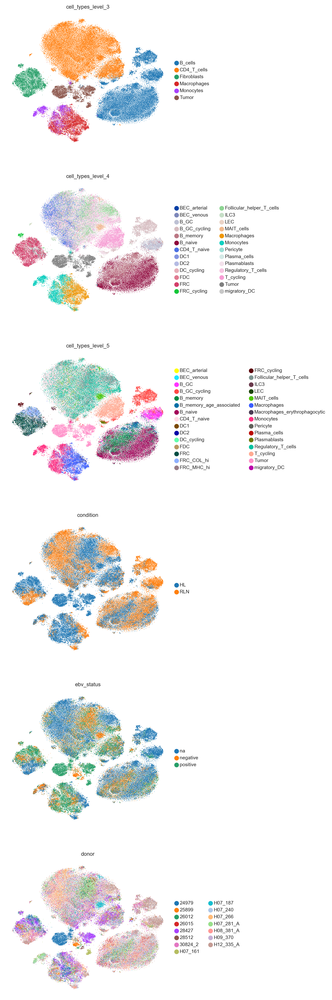

In [63]:
sc.set_figure_params(frameon=False, dpi=150, fontsize=8)
sc.pl.tsne(adata, color=['cell_types_level_3','cell_types_level_4', 'cell_types_level_5', 'condition', 'ebv_status', 'donor'], 
           ncols=1, use_raw=False,
          save=' - chl - metadata.png')

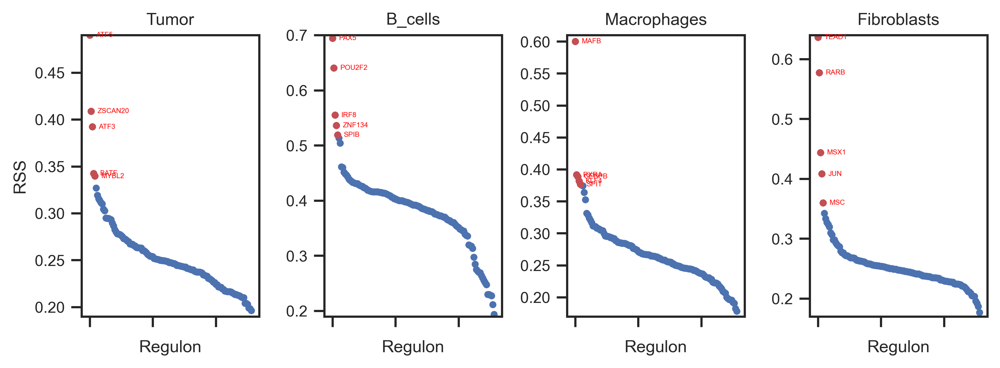

In [64]:
sns.set(font_scale=0.8)
sns.set_style("ticks")

fig, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(8, 3), dpi=200)
plot_rss(rss, 'Tumor', ax=ax1)
plot_rss(rss, 'B_cells', ax=ax2)
ax2.set_ylabel('')
plot_rss(rss, 'Macrophages', ax=ax3)
ax3.set_ylabel('')
plot_rss(rss, 'Fibroblasts', ax=ax4)
ax4.set_ylabel('')
plt.tight_layout()
savesvg('plots - GSE115978 - rss.svg', fig)